# PROYECTO DE MACHINE LEARNING: PREDICCIÓN DEL NIVEL DE BURNOUT EN EL TRABAJO

## TEMA

El burnout, o síndrome de desgaste profesional, es un problema creciente en el entorno laboral moderno, caracterizado por un estado de agotamiento físico, emocional y mental causado por el estrés prolongado en el trabajo. Identificar y mitigar el burnout es crucial para mantener el bienestar de los empleados y la productividad de las organizaciones. Este proyecto se centra en desarrollar un modelo de predicción basado en Machine Learning (ML) para evaluar el nivel de burnout en los empleados.

## HIPÓTESIS

1. Las personas con mayor responsabilidad tendrán más probabilidad de sufrir burnout.
2. Las personas que dediquen más horas de trabajo al día y que no dispongan de teletrabajo tendrán más probabilidad de sufrir burnout. 
3. Las personas dedicadas al sector del servicio tendrán más probabilidad de sufrir burnout que las personas dedicadas al sector de producción. 
4. Existirá una correlación positiva y significativa entre el nivel de fatiga mental y burnout. 
5. Se establece como objetivo exploratorio comprobar la posible relación entre género y burnout.


### LIBRERÍAS

In [2]:
# básicas

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from datetime import datetime

# ML

from sklearn.model_selection import train_test_split



#### Importar datos

In [3]:
df_burnout = pd.read_csv("./data/train.csv")

#### Primera exploración de datos 

In [4]:
df_burnout

,Employee ID,Date of Joining,Gender,Company Type,WFH Setup Available,Designation,Resource Allocation,Mental Fatigue Score,Burn Rate
0,fffe32003000360033003200,2008-09-30,Female,Service,No,2.0,3.0,3.8,0.16
1,fffe3700360033003500,2008-11-30,Male,Service,Yes,1.0,2.0,5.0,0.36
2,fffe31003300320037003900,2008-03-10,Female,Product,Yes,2.0,NaN,5.8,0.49
3,fffe32003400380032003900,2008-11-03,Male,Service,Yes,1.0,1.0,2.6,0.20
4,fffe31003900340031003600,2008-07-24,Female,Service,No,3.0,7.0,6.9,0.52
...,...,...,...,...,...,...,...,...,...
22745,fffe31003500370039003100,2008-12-30,Female,Service,No,1.0,3.0,NaN,0.41
22746,fffe33003000350031003800,2008-01-19,Female,Product,Yes,3.0,6.0,6.7,0.59
22747,fffe390032003000,2008-11-05,Male,Service,Yes,3.0,7.0,NaN,0.72
22748,fffe33003300320036003900,2008-01-10,Female,Service,No,2.0,5.0,5.9,0.52


#### ¿ Qué variables tenemos?

(EN)  

- Employee ID: The unique ID allocated for each employee (example: fffe390032003000)  
- Date of Joining: The date-time when the employee has joined the organization (example: 2008-12-30)  
- Gender: The gender of the employee (Male/Female)  
- Company Type: The type of company where the employee is working (Service/Product)  
- WFH Setup Available: Is the work from home facility available for the employee (Yes/No)  
- Designation: The designation of the employee of work in the organization.  
    In the range of [0.0, 5.0] bigger is higher designation.  
- Resource Allocation: The amount of resource allocated to the employee to work, ie. number of working hours.  
    In the range of [1.0, 10.0] (higher means more resource)  
- Mental Fatigue Score: The level of fatigue mentally the employee is facing.  
    In the range of [0.0, 10.0] where 0.0 means no fatigue and 10.0 means completely fatigue.  
- Burn Rate: The value we need to predict for each employee telling the rate of Bur out while working. 
    In the range of [0.0, 1.0] where the higher the value is more is the burn out.  

(ES)  

- **ID del empleado**: ID único asignado a cada empleado (ejemplo: fffe390032003000).
- **Fecha de ingreso**: La fecha y hora en que el empleado se unió a la organización (ejemplo: 2008-12-30).
- **Género**: El género del empleado (Masculino/Femenino).
- **Tipo de empresa**: El tipo de empresa donde el empleado trabaja (Servicios/Productos).
- **Facilidad para trabajar desde casa**: Indica si el empleado tiene la posibilidad de trabajar desde casa (Sí/No).
- **Designación**: La designación del empleado en la organización, en un rango de [0.0, 5.0], donde un valor más alto indica una designación más alta.
- **Asignación de recursos**: La cantidad de recursos asignados al empleado para trabajar, es decir, el número de horas de trabajo, en un rango de [1.0, 10.0], donde un valor más alto indica más recursos.
- **Puntuación de fatiga mental**: El nivel de fatiga mental que enfrenta el empleado, en un rango de [0.0, 10.0], donde 0.0 significa sin fatiga y 10.0 significa completamente fatigado.
- **Tasa de Burnout**: El valor que necesitamos predecir para cada empleado, indicando la tasa de burnout mientras trabaja, en un rango de [0.0, 1.0], donde un valor más alto indica un mayor nivel de burnout.

In [5]:
df_burnout.describe()

,Designation,Resource Allocation,Mental Fatigue Score,Burn Rate
count,22750.000000,21369.000000,20633.000000,21626.000000
mean,2.178725,4.481398,5.728188,0.452005
std,1.135145,2.047211,1.920839,0.198226
min,0.000000,1.000000,0.000000,0.000000
25%,1.000000,3.000000,4.600000,0.310000
50%,2.000000,4.000000,5.900000,0.450000
75%,3.000000,6.000000,7.100000,0.590000
max,5.000000,10.000000,10.000000,1.000000


In [6]:
df_burnout.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22750 entries, 0 to 22749
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Employee ID           22750 non-null  object 
 1   Date of Joining       22750 non-null  object 
 2   Gender                22750 non-null  object 
 3   Company Type          22750 non-null  object 
 4   WFH Setup Available   22750 non-null  object 
 5   Designation           22750 non-null  float64
 6   Resource Allocation   21369 non-null  float64
 7   Mental Fatigue Score  20633 non-null  float64
 8   Burn Rate             21626 non-null  float64
dtypes: float64(4), object(5)
memory usage: 1.6+ MB


### Limpieza

Debido al alto volumen de datos de personas asalariadas, y en vista a los nulos, opto por eliminar aquellas personas que tengan algún dato faltante. 

In [7]:
df = df_burnout.dropna()
df

,Employee ID,Date of Joining,Gender,Company Type,WFH Setup Available,Designation,Resource Allocation,Mental Fatigue Score,Burn Rate
0,fffe32003000360033003200,2008-09-30,Female,Service,No,2.0,3.0,3.8,0.16
1,fffe3700360033003500,2008-11-30,Male,Service,Yes,1.0,2.0,5.0,0.36
3,fffe32003400380032003900,2008-11-03,Male,Service,Yes,1.0,1.0,2.6,0.20
4,fffe31003900340031003600,2008-07-24,Female,Service,No,3.0,7.0,6.9,0.52
5,fffe3300350037003500,2008-11-26,Male,Product,Yes,2.0,4.0,3.6,0.29
...,...,...,...,...,...,...,...,...,...
22743,fffe3300390030003600,2008-12-15,Female,Product,Yes,1.0,3.0,6.0,0.48
22744,fffe32003500370033003200,2008-05-27,Male,Product,No,3.0,7.0,6.2,0.54
22746,fffe33003000350031003800,2008-01-19,Female,Product,Yes,3.0,6.0,6.7,0.59
22748,fffe33003300320036003900,2008-01-10,Female,Service,No,2.0,5.0,5.9,0.52


Para facilitarme el trabajo, voy a cambiar el título de las columnas.

In [8]:
df = df.rename(columns={
    'Employee ID': 'id',
    'Date of Joining': 'date',
    'Gender': 'gender',
    'Company Type': 'company',
    'WFH Setup Available': 'wfh',
    'Designation': 'position',
    'Resource Allocation': 'allocation',
    'Mental Fatigue Score': 'mentalfatige',
    'Burn Rate': 'burnout'
})

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18590 entries, 0 to 22749
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            18590 non-null  object 
 1   date          18590 non-null  object 
 2   gender        18590 non-null  object 
 3   company       18590 non-null  object 
 4   wfh           18590 non-null  object 
 5   position      18590 non-null  float64
 6   allocation    18590 non-null  float64
 7   mentalfatige  18590 non-null  float64
 8   burnout       18590 non-null  float64
dtypes: float64(4), object(5)
memory usage: 1.4+ MB


In [10]:
# from datetime import datetime


# Convertir la columna 'date' al formato de fecha si aún no está en ese formato
df['date'] = pd.to_datetime(df['date'])

# Obtener la fecha actual
current_date = datetime.now()

# Calcular la diferencia en años entre la fecha actual y la fecha de ingreso
df['years'] = current_date.year - df['date'].dt.year

# Mostrar los resultados
print(df[['date', 'years']].head())


        date  years
0 2008-09-30     16
1 2008-11-30     16
3 2008-11-03     16
4 2008-07-24     16
5 2008-11-26     16


In [11]:
df.describe()

,date,position,allocation,mentalfatige,burnout,years
count,18590,18590.000000,18590.000000,18590.000000,18590.000000,18590.0
mean,2008-07-01 11:44:02.582033408,2.179398,4.486552,5.732173,0.452444,16.0
min,2008-01-01 00:00:00,0.000000,1.000000,0.000000,0.000000,16.0
25%,2008-04-01 00:00:00,1.000000,3.000000,4.600000,0.320000,16.0
50%,2008-07-03 00:00:00,2.000000,4.000000,5.900000,0.450000,16.0
75%,2008-09-30 00:00:00,3.000000,6.000000,7.100000,0.590000,16.0
max,2008-12-31 00:00:00,5.000000,10.000000,10.000000,1.000000,16.0
std,NaN,1.133148,2.044848,1.920547,0.197848,0.0


Me quedo con un dataset con 18590 entradas y con la característica de que todas las personas llevan 16 años en su empresa, por lo que no es discriminativo respecto a otras fechas. Elimino esas dos columnas. 

In [12]:
# Listar las columnas que quieres eliminar
delete = ['date', 'years', 'id']

# Eliminar las columnas especificadas
df = df.drop(delete, axis=1)

Vamos a codificar de forma numérica las variables object:

In [13]:
df['gender'] = df['gender'].replace({'Male': 1, 'Female': 0})
df['company'] = df['company'].replace({'Service': 1, 'Product' : 0})
df['wfh'] = df['wfh'].replace({'Yes' : 1, 'No' : 0})

C:\Users\maria\AppData\Local\Temp\ipykernel_5000\4236369812.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['gender'] = df['gender'].replace({'Male': 1, 'Female': 0})
C:\Users\maria\AppData\Local\Temp\ipykernel_5000\4236369812.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['company'] = df['company'].replace({'Service': 1, 'Product' : 0})
C:\Users\maria\AppData\Local\Temp\ipykernel_5000\4236369812.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain t

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18590 entries, 0 to 22749
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   gender        18590 non-null  int64  
 1   company       18590 non-null  int64  
 2   wfh           18590 non-null  int64  
 3   position      18590 non-null  float64
 4   allocation    18590 non-null  float64
 5   mentalfatige  18590 non-null  float64
 6   burnout       18590 non-null  float64
dtypes: float64(4), int64(3)
memory usage: 1.1 MB


Observamos la distribución de la target: burnout.

C:\Users\maria\AppData\Local\Temp\ipykernel_5000\3820772710.py:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['burnout'], shade=True)


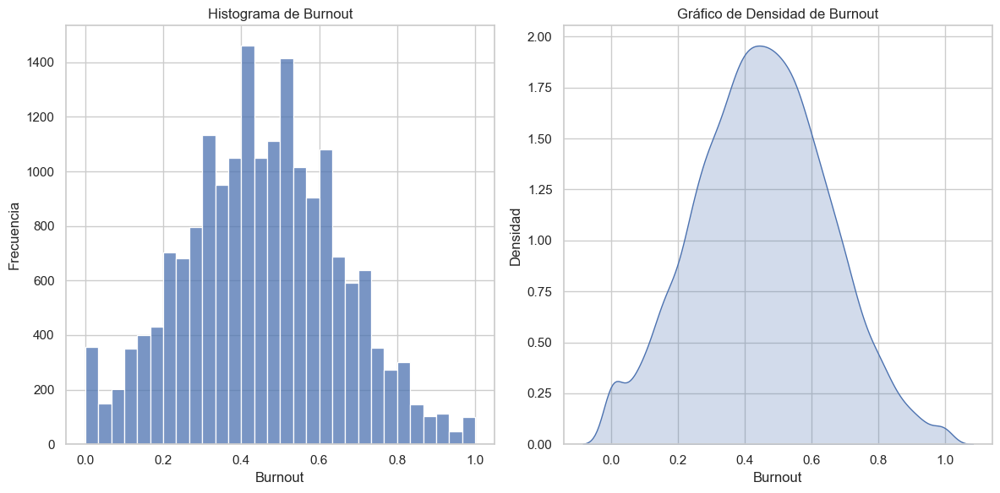

In [15]:
# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear una figura con subplots
plt.figure(figsize=(12, 6))

# Histograma
plt.subplot(1, 2, 1)
sns.histplot(df['burnout'], bins=30, kde=False)
plt.title('Histograma de Burnout')
plt.xlabel('Burnout')
plt.ylabel('Frecuencia')

# Gráfico de densidad
plt.subplot(1, 2, 2)
sns.kdeplot(df['burnout'], shade=True)
plt.title('Gráfico de Densidad de Burnout')
plt.xlabel('Burnout')
plt.ylabel('Densidad')

# Mostrar los gráficos
plt.tight_layout()
plt.show()


In [16]:
df.describe()

,gender,company,wfh,position,allocation,mentalfatige,burnout
count,18590.000000,18590.000000,18590.000000,18590.000000,18590.000000,18590.000000,18590.000000
mean,0.475686,0.654868,0.539537,2.179398,4.486552,5.732173,0.452444
std,0.499422,0.475424,0.498448,1.133148,2.044848,1.920547,0.197848
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,3.000000,4.600000,0.320000
50%,0.000000,1.000000,1.000000,2.000000,4.000000,5.900000,0.450000
75%,1.000000,1.000000,1.000000,3.000000,6.000000,7.100000,0.590000
max,1.000000,1.000000,1.000000,5.000000,10.000000,10.000000,1.000000


Los distribución es normal.

### Análisis de variables

Para analizar las variables sin hacer spoiler de datos que voy a usar en el test, voy primero a dividir los datos.

In [17]:
X = df.drop('burnout', axis=1)  # características
y = df['burnout']  # variable target

# Dividir los datos en entrenamiento y prueba
# from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Mostrar las dimensiones de los conjuntos divididos
print("Tamaño del conjunto de entrenamiento (X_train):", X_train.shape)
print("Tamaño del conjunto de prueba (X_test):", X_test.shape)
print("Tamaño de las etiquetas de entrenamiento (y_train):", y_train.shape)
print("Tamaño de las etiquetas de prueba (y_test):", y_test.shape)

Tamaño del conjunto de entrenamiento (X_train): (14872, 6)
Tamaño del conjunto de prueba (X_test): (3718, 6)
Tamaño de las etiquetas de entrenamiento (y_train): (14872,)
Tamaño de las etiquetas de prueba (y_test): (3718,)


In [18]:
feature_names = X.columns
print(feature_names)


Index(['gender', 'company', 'wfh', 'position', 'allocation', 'mentalfatige'], dtype='object')


In [19]:
# Asegurarse de que tengamos los mismos índices para X_train y y_train

y_train = y_train[X_train.index]


In [20]:
X_train

,gender,company,wfh,position,allocation,mentalfatige
19000,1,0,1,2.0,6.0,8.8
19405,1,1,0,3.0,7.0,7.1
9965,0,0,0,2.0,3.0,6.0
613,0,0,0,3.0,6.0,4.9
3475,1,0,0,0.0,1.0,0.6
...,...,...,...,...,...,...
13864,0,1,0,3.0,5.0,5.2
14685,0,1,1,1.0,2.0,4.3
6570,1,0,0,1.0,2.0,4.9
1058,0,0,1,1.0,3.0,5.1


In [21]:
y_train

19000    0.71
19405    0.63
9965     0.48
613      0.32
3475     0.05
         ... 
13864    0.31
14685    0.23
6570     0.32
1058     0.27
19353    0.72
Name: burnout, Length: 14872, dtype: float64

In [22]:
X_test

,gender,company,wfh,position,allocation,mentalfatige
8815,1,1,1,1.0,2.0,3.9
10896,1,1,1,2.0,4.0,5.2
16049,1,1,0,3.0,4.0,4.6
1746,0,1,1,2.0,4.0,6.8
5473,1,1,1,4.0,9.0,7.8
...,...,...,...,...,...,...
18911,1,0,1,2.0,5.0,5.6
15930,1,0,1,3.0,6.0,6.1
17999,0,1,1,3.0,5.0,5.7
12884,1,0,0,3.0,5.0,6.9


In [23]:
y_test

8815     0.18
10896    0.29
16049    0.36
1746     0.48
5473     0.79
         ... 
18911    0.41
15930    0.48
17999    0.49
12884    0.61
8694     0.46
Name: burnout, Length: 3718, dtype: float64

### Análisis bivariado

En primer lugar, se comprueba el supuesto de normalidad de la variable dependiente, burnout. Lo hacemos mediante la Prueba de Kolmogorov-Smirnov al contar en esta base de datos con una muestra superior a 50 filas. 

In [24]:
from scipy.stats import kstest
ks_statistic, p_value = kstest(y_train, 'norm')
print(f"Estadístico KS: {ks_statistic}")
print(f"Valor P: {p_value}")

Estadístico KS: 0.5017576495825727
Valor P: 0.0


### 1. gender

In [25]:
X_train['gender'].value_counts()

gender
0    7792
1    7080
Name: count, dtype: int64

In [26]:
from scipy.stats import mannwhitneyu

# Subestablecer y_train basado en el género de X_train
burnout_woman = y_train[X_train['gender'] == 0]
burnout_man = y_train[X_train['gender'] == 1]

# Realizar la prueba de Mann-Whitney U
u_statistic, p_value = mannwhitneyu(burnout_woman, burnout_man, alternative='two-sided')
print('U Statistic:', u_statistic)
print('P-Value:', p_value)

U Statistic: 22117684.0
P-Value: 4.727618132517683e-97


Parece que sí hay relación significativa entre el género y el burnout, aunque es muy pequeña. Veamos quién sufre más este fenómeno.

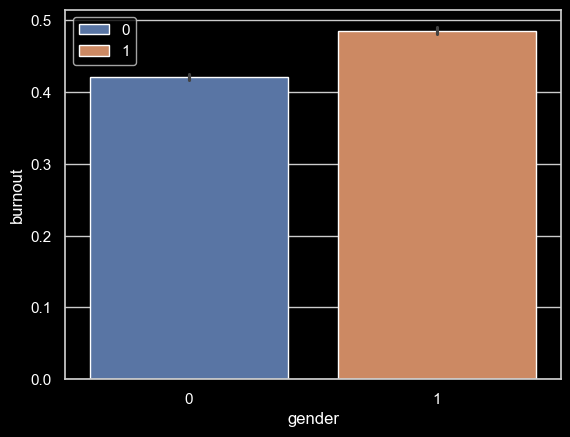

In [27]:
# Ajustar el tema de Seaborn y Matplotlib para el fondo negro y letras blancas
sns.set(style="whitegrid", rc={'axes.facecolor':'black', 'figure.facecolor':'black'})

# Crear el gráfico de barras
fig, ax = plt.subplots()

# Configurar los colores de las barras y las líneas
sns.barplot(x="gender", y=y_train, data=df, hue="gender", ax=ax)

# Cambiar el color de los ejes y las etiquetas
ax.set_facecolor("black")
ax.tick_params(colors='white', which='both')  # Color de los ticks
ax.xaxis.label.set_color('white')  # Color de la etiqueta del eje X
ax.yaxis.label.set_color('white')  # Color de la etiqueta del eje Y
ax.title.set_color('white')  # Color del título del gráfico

# Cambiar el color de la leyenda
legend = ax.legend()
for text in legend.get_texts():
    text.set_color('white')

# Mostrar el gráfico
plt.show()


In [28]:
# Calcular las medianas de burnout para hombres y mujeres
mediana_burnout_mujeres = burnout_woman.median()
mediana_burnout_hombres = burnout_man.median()

# Calcular las medias de burnout para hombres y mujeres
media_burnout_mujeres = burnout_woman.mean()
media_burnout_hombres = burnout_man.mean()

print('Mediana de burnout para mujeres:', mediana_burnout_mujeres)
print('Mediana de burnout para hombres:', mediana_burnout_hombres)

print('Media de burnout para mujeres:', media_burnout_mujeres)
print('Media de burnout para hombres:', media_burnout_hombres)

# Determinar quién sufre más burnout basado en la mediana
if mediana_burnout_mujeres > mediana_burnout_hombres:
    print('Las mujeres sufren más burnout que los hombres (basado en la mediana).')
elif mediana_burnout_hombres > mediana_burnout_mujeres:
    print('Los hombres sufren más burnout que las mujeres (basado en la mediana).')
else:
    print('No hay diferencia en el burnout entre hombres y mujeres (basado en la mediana).')

# Determinar quién sufre más burnout basado en la media
if media_burnout_mujeres > media_burnout_hombres:
    print('Las mujeres sufren más burnout que los hombres (basado en la media).')
elif media_burnout_hombres > media_burnout_mujeres:
    print('Los hombres sufren más burnout que las mujeres (basado en la media).')
else:
    print('No hay diferencia en el burnout entre hombres y mujeres (basado en la media).')

Mediana de burnout para mujeres: 0.42
Mediana de burnout para hombres: 0.5
Media de burnout para mujeres: 0.4217068788501027
Media de burnout para hombres: 0.48538276836158195
Los hombres sufren más burnout que las mujeres (basado en la mediana).
Los hombres sufren más burnout que las mujeres (basado en la media).


### 2. company

In [29]:
X_train['company'].value_counts()

company
1    9730
0    5142
Name: count, dtype: int64

In [30]:
# Subestablecer y_train basado en el género de X_train
burnout_product = y_train[X_train['company'] == 0]
burnout_service = y_train[X_train['company'] == 1]

# Realizar la prueba de Mann-Whitney U
u_statistic, p_value = mannwhitneyu(burnout_product, burnout_service, alternative='two-sided')
print('U Statistic:', u_statistic)
print('P-Value:', p_value)

U Statistic: 24750165.0
P-Value: 0.28598487384660953


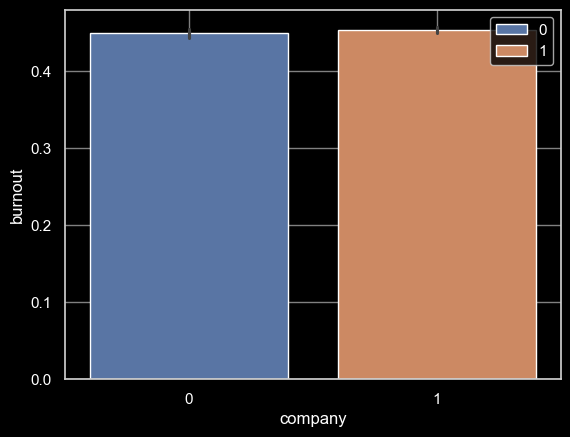

In [31]:
# Ajustar el tema de Seaborn y Matplotlib para el fondo negro y letras blancas
sns.set(style="whitegrid", rc={'axes.facecolor':'black', 'figure.facecolor':'black'})

# Crear el gráfico de barras
fig, ax = plt.subplots()

# Configurar los colores de las barras y las líneas
sns.barplot(x="company", y=y_train, data=df, hue="company", ax=ax)

# Cambiar el color de los ejes y las etiquetas
ax.set_facecolor("black")
ax.tick_params(colors='white', which='both')  # Color de los ticks
ax.xaxis.label.set_color('white')  # Color de la etiqueta del eje X
ax.yaxis.label.set_color('white')  # Color de la etiqueta del eje Y
ax.title.set_color('white')  # Color del título del gráfico

# Cambiar el color de la leyenda
legend = ax.legend()
for text in legend.get_texts():
    text.set_color('white')

# Cambiar el color de las líneas de la cuadrícula
ax.grid(color='gray')  # Opcional, si se desea que las líneas de la cuadrícula sean grises

# Mostrar el gráfico
plt.show()


### 3. wfh

In [32]:
X_train['wfh'].value_counts()

wfh
1    8032
0    6840
Name: count, dtype: int64

In [33]:
# Subestablecer y_train basado en el género de X_train
burnout_nowfh = y_train[X_train['wfh'] == 0]
burnout_yeswfh = y_train[X_train['wfh'] == 1]

# Realizar la prueba de Mann-Whitney U
u_statistic, p_value = mannwhitneyu(burnout_nowfh, burnout_yeswfh, alternative='two-sided')
print('U Statistic:', u_statistic)
print('P-Value:', p_value)

U Statistic: 37804732.0
P-Value: 0.0


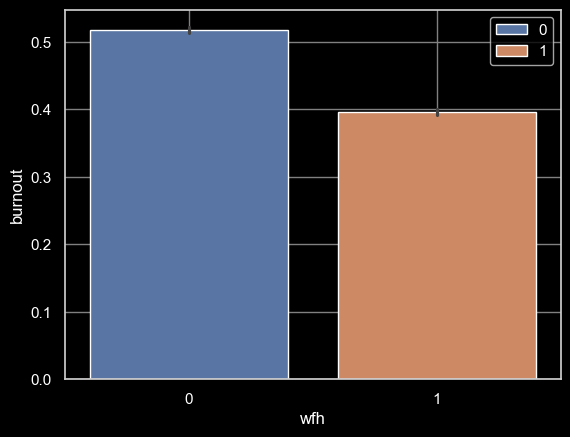

In [34]:
# Ajustar el tema de Seaborn y Matplotlib para el fondo negro y letras blancas
sns.set(style="whitegrid", rc={'axes.facecolor':'black', 'figure.facecolor':'black'})

# Crear el gráfico de barras
fig, ax = plt.subplots()

# Configurar los colores de las barras y las líneas
sns.barplot(x="wfh", y=y_train, data=df, hue="wfh", ax=ax)

# Cambiar el color de los ejes y las etiquetas
ax.set_facecolor("black")
ax.tick_params(colors='white', which='both')  # Color de los ticks
ax.xaxis.label.set_color('white')  # Color de la etiqueta del eje X
ax.yaxis.label.set_color('white')  # Color de la etiqueta del eje Y
ax.title.set_color('white')  # Color del título del gráfico

# Cambiar el color de la leyenda
legend = ax.legend()
for text in legend.get_texts():
    text.set_color('white')

# Cambiar el color de las líneas de la cuadrícula
ax.grid(color='gray')  # Opcional, si se desea que las líneas de la cuadrícula sean grises

# Mostrar el gráfico
plt.show()


In [35]:
# Calcular las medianas de burnout para quienes no trabajan desde casa y quienes sí
mediana_burnout_nowfh = burnout_nowfh.median()
mediana_burnout_yeswfh = burnout_yeswfh.median()

# Calcular las medias de burnout para quienes no trabajan desde casa y quienes sí
media_burnout_nowfh = burnout_nowfh.mean()
media_burnout_yeswfh = burnout_yeswfh.mean()

print('Mediana de burnout para quienes no trabajan desde casa:', mediana_burnout_nowfh)
print('Mediana de burnout para quienes sí trabajan desde casa:', mediana_burnout_yeswfh)

print('Media de burnout para quienes no trabajan desde casa:', media_burnout_nowfh)
print('Media de burnout para quienes sí trabajan desde casa:', media_burnout_yeswfh)

# Determinar quién sufre más burnout basado en la mediana
if mediana_burnout_nowfh > mediana_burnout_yeswfh:
    print('Quienes no trabajan desde casa sufren más burnout que quienes sí (basado en la mediana).')
elif mediana_burnout_yeswfh > mediana_burnout_nowfh:
    print('Quienes sí trabajan desde casa sufren más burnout que quienes no (basado en la mediana).')
else:
    print('No hay diferencia en el burnout entre quienes trabajan desde casa y quienes no (basado en la mediana).')

# Determinar quién sufre más burnout basado en la media
if media_burnout_nowfh > media_burnout_yeswfh:
    print('Quienes no trabajan desde casa sufren más burnout que quienes sí (basado en la media).')
elif media_burnout_yeswfh > media_burnout_nowfh:
    print('Quienes sí trabajan desde casa sufren más burnout que quienes no (basado en la media).')
else:
    print('No hay diferencia en el burnout entre quienes trabajan desde casa y quienes no (basado en la media).')

Mediana de burnout para quienes no trabajan desde casa: 0.54
Mediana de burnout para quienes sí trabajan desde casa: 0.39
Media de burnout para quienes no trabajan desde casa: 0.5173070175438597
Media de burnout para quienes sí trabajan desde casa: 0.3964230577689243
Quienes no trabajan desde casa sufren más burnout que quienes sí (basado en la mediana).
Quienes no trabajan desde casa sufren más burnout que quienes sí (basado en la media).


### 4. position

In [36]:
X_train['position'].value_counts(sort=True)

position
2.0    4967
3.0    3900
1.0    3202
4.0    1571
0.0     974
5.0     258
Name: count, dtype: int64

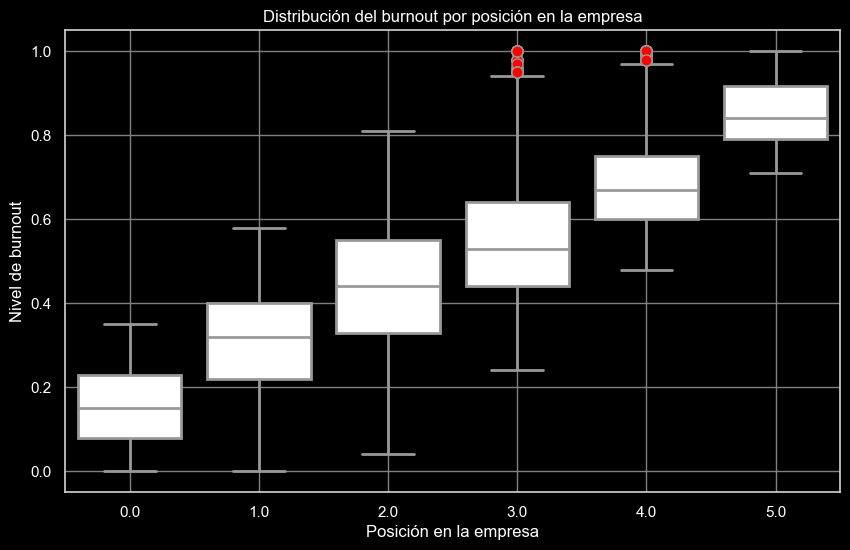

In [37]:

# Ajustar el tema de Seaborn y Matplotlib para el fondo negro y letras blancas
sns.set(style="whitegrid", rc={'axes.facecolor':'black', 'figure.facecolor':'black'})

# Crear el gráfico de boxplot
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x=X_train['position'], y=y_train, linewidth=2, color='white', flierprops=dict(marker='o', markersize=8, markerfacecolor='red', linestyle='none'))

# Cambiar el color de los ejes y las etiquetas
ax.set_facecolor("black")
ax.tick_params(colors='white', which='both')  # Color de los ticks
ax.xaxis.label.set_color('white')  # Color de la etiqueta del eje X
ax.yaxis.label.set_color('white')  # Color de la etiqueta del eje Y
ax.title.set_color('white')  # Color del título del gráfico

# Cambiar el color de las líneas de la cuadrícula
ax.grid(color='gray')  # Opcional, si se desea que las líneas de la cuadrícula sean grises

# Establecer el título del gráfico
plt.title('Distribución del burnout por posición en la empresa', color='white')
plt.xlabel('Posición en la empresa', color='white')
plt.ylabel('Nivel de burnout', color='white')

# Mostrar el gráfico
plt.show()


In [38]:
from scipy.stats import kruskal

# Aplica la prueba de Kruskal-Wallis para analizar la relación
# Agrupar los datos por posición
grupos = [y_train[X_train['position'] == pos] for pos in X_train['position'].unique()] #crea una lista de grupos de burnout para cada posición en la empresa.

# Realizar la prueba de Kruskal-Wallis
resultado_kw = kruskal(*grupos)

print('Estadística de prueba de Kruskal-Wallis:', resultado_kw.statistic)
print('Valor p:', resultado_kw.pvalue)

Estadística de prueba de Kruskal-Wallis: 7830.136741343886
Valor p: 0.0


### 5. allocation

In [39]:
X_train['allocation'].value_counts()

allocation
4.0     2719
5.0     2696
3.0     2200
6.0     2056
2.0     1449
7.0     1349
1.0     1238
8.0      741
9.0      321
10.0     103
Name: count, dtype: int64

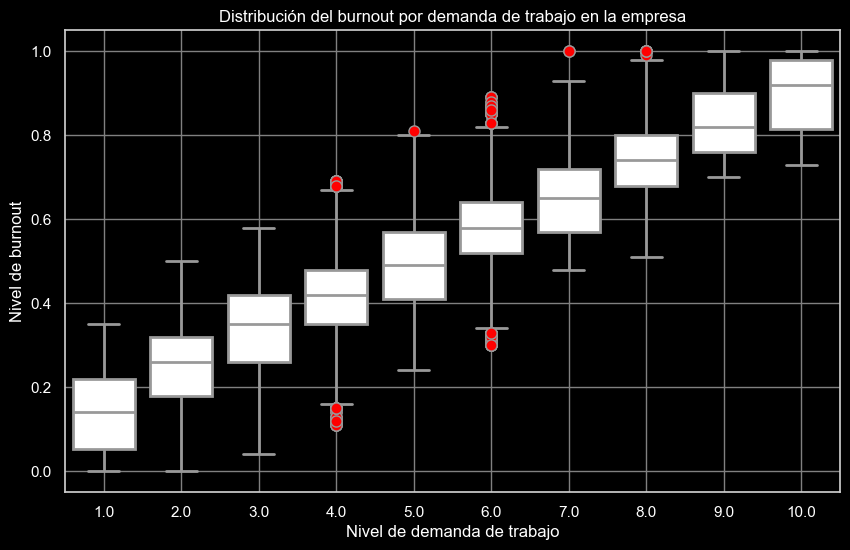

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ajustar el tema de Seaborn y Matplotlib para el fondo negro y letras blancas
sns.set(style="whitegrid", rc={'axes.facecolor':'black', 'figure.facecolor':'black'})

# Crear el gráfico de boxplot
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x=X_train['allocation'], y=y_train, linewidth=2, color='white', flierprops=dict(marker='o', markersize=8, markerfacecolor='red', linestyle='none'))

# Cambiar el color de los ejes y las etiquetas
ax.set_facecolor("black")
ax.tick_params(colors='white', which='both')  # Color de los ticks
ax.xaxis.label.set_color('white')  # Color de la etiqueta del eje X
ax.yaxis.label.set_color('white')  # Color de la etiqueta del eje Y
ax.title.set_color('white')  # Color del título del gráfico

# Cambiar el color de las líneas de la cuadrícula
ax.grid(color='gray')  # Opcional, si se desea que las líneas de la cuadrícula sean grises

# Establecer el título del gráfico
plt.title('Distribución del burnout por demanda de trabajo en la empresa', color='white')
plt.xlabel('Nivel de demanda de trabajo', color='white')
plt.ylabel('Nivel de burnout', color='white')

# Mostrar el gráfico
plt.show()


In [41]:
# Aplica la prueba de Kruskal-Wallis para analizar la relación
# Agrupar los datos por demanda de trabajo en la empresa
grupos = [y_train[X_train['allocation'] == allo] for allo in X_train['allocation'].unique()] #crea una lista de grupos de burnout para cada grupo de demanda de trabajo en la empresa.

# Realizar la prueba de Kruskal-Wallis
resultado_kw = kruskal(*grupos)

print('Estadística de prueba de Kruskal-Wallis:', resultado_kw.statistic)
print('Valor p:', resultado_kw.pvalue)

Estadística de prueba de Kruskal-Wallis: 10690.133374942987
Valor p: 0.0


### 6. mental fatige

In [42]:
X_train['mentalfatige'].value_counts()

mentalfatige
6.0    345
5.9    332
6.1    330
5.8    325
6.5    324
      ... 
0.6     16
9.9     15
0.4     12
0.3      9
0.1      9
Name: count, Length: 101, dtype: int64

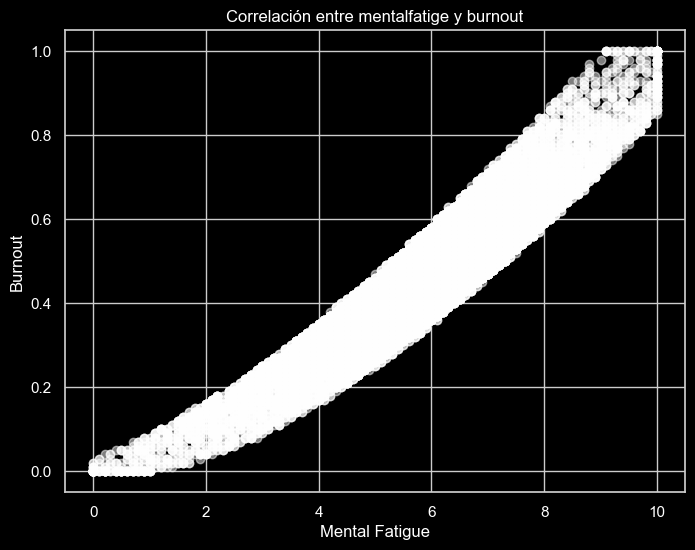

In [43]:
# Crear el gráfico de scatterplot
plt.figure(figsize=(8, 6))
plt.scatter(X_train['mentalfatige'], y_train, alpha=0.5, color='w')

# Añadir título y etiquetas
plt.title('Correlación entre mentalfatige y burnout', color='white')
plt.xlabel('Mental Fatigue', color='white')
plt.ylabel('Burnout', color='white')

# Cambiar el color de las marcas de los ejes X e Y
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')

# Mostrar el gráfico
plt.show()



In [44]:
corr = X_train.corr(numeric_only = True)
print(corr)

                gender   company       wfh  position  allocation  mentalfatige
gender        1.000000 -0.013046 -0.069084  0.113595    0.144754      0.148931
company      -0.013046  1.000000  0.001437  0.015679    0.011937      0.007991
wfh          -0.069084  0.001437  1.000000 -0.230899   -0.284017     -0.275076
position      0.113595  0.015679 -0.230899  1.000000    0.877909      0.691430
allocation    0.144754  0.011937 -0.284017  0.877909    1.000000      0.798285
mentalfatige  0.148931  0.007991 -0.275076  0.691430    0.798285      1.000000


<Axes: >

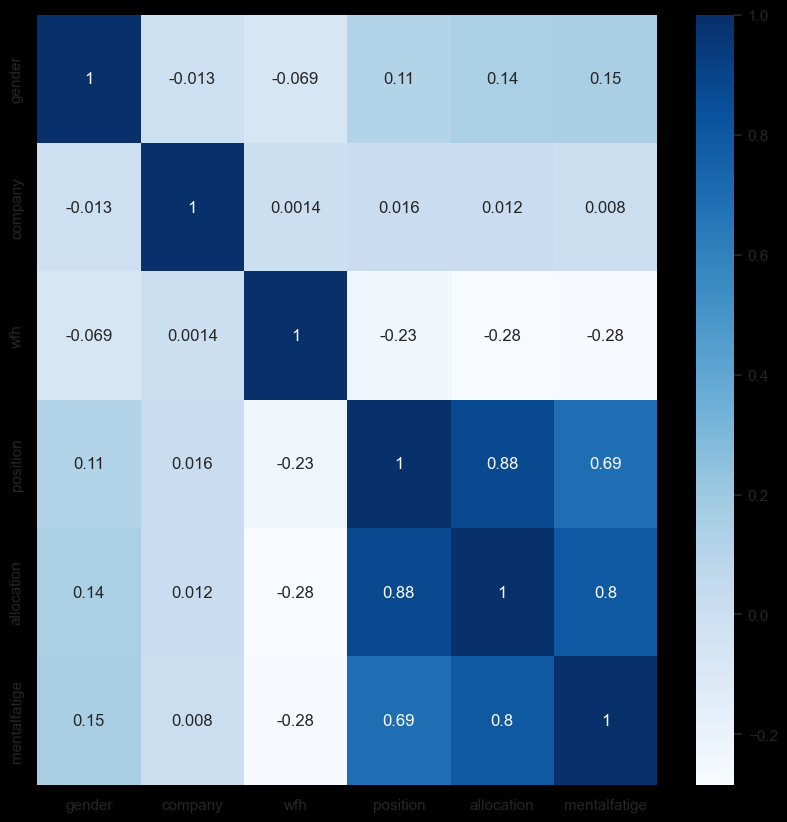

In [45]:
plt.figure(figsize = (10,10))
sns.heatmap(corr, annot = True, cmap = "Blues")

In [46]:
# Seleccionar solo las variables numéricas
numeric_features = X_train.select_dtypes(include=[np.number])

# Combinar las variables numéricas de X_train y y_train en un solo DataFrame
df_train_numeric = numeric_features.copy()
df_train_numeric['burnout'] = y_train

# Calcular la matriz de correlación solo con las variables numéricas
corr_matrix_numeric = df_train_numeric.corr()

# Extraer las correlaciones con la variable target 'burnout' y ordenarlas
corr_with_target_numeric = corr_matrix_numeric['burnout'].sort_values(ascending=False)

print(corr_with_target_numeric)

burnout         1.000000
mentalfatige    0.944498
allocation      0.854100
position        0.736413
gender          0.160366
company         0.009432
wfh            -0.303813
Name: burnout, dtype: float64


Se observan altas correlaciones positivas entre el nivel del cargo, la demanda de trabajo y la fatiga mental que tiene la persona empleada para sufrir con mayor probabilidad burnout.

In [47]:
from sklearn.preprocessing import MinMaxScaler

# Crear una instancia de MinMaxScaler
scaler = MinMaxScaler()

# Ajustar el scaler solo con los datos de entrenamiento y transformar los datos de entrenamiento
X_train = scaler.fit_transform(X_train)

# Transformar los datos de prueba (sin ajustar nuevamente el scaler)
X_test = scaler.transform(X_test)

# Ahora, X_train_scaled y X_test_scaled están estandarizados
print("Valores mínimos de cada característica en X_train_scaled:", X_train.min(axis=0))
print("Valores máximos de cada característica en X_train_scaled:", X_train.max(axis=0)) 

Valores mínimos de cada característica en X_train_scaled: [0. 0. 0. 0. 0. 0.]
Valores máximos de cada característica en X_train_scaled: [1. 1. 1. 1. 1. 1.]


## Prueba con Regresión lineal 

In [48]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()

lin_reg.fit(X_train, y_train)

LinearRegression()

Features importances:

In [49]:
lin_reg.coef_

array([ 4.71412176e-03,  3.28569203e-04, -1.11125856e-02, -2.28381160e-02,
        2.56132431e-01,  7.40903384e-01])

In [50]:
# Obtener los coeficientes y el intercepto
coeficientes = lin_reg.coef_
intercepto = lin_reg.intercept_

# Imprimir los nombres de las características y sus coeficientes
for feature, coef in zip(feature_names, coeficientes):
    print(f"{feature}: {coef}")
print("Intercepto:", intercepto)

gender: 0.004714121755664731
company: 0.0003285692028701104
wfh: -0.011112585619120383
position: -0.02283811597622902
allocation: 0.2561324313212563
mentalfatige: 0.7409033844478231
Intercepto: -0.05798651281702305


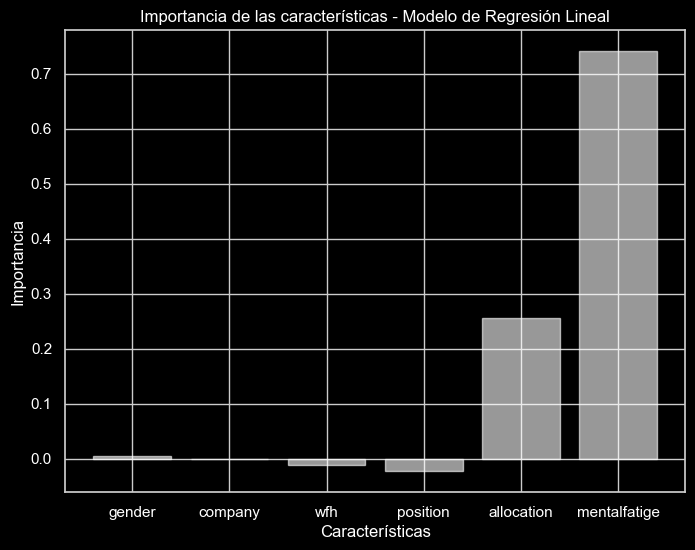

In [51]:
# Graficar las importancias de las características
plt.figure(figsize=(8, 6))
plt.bar(feature_names, coeficientes, color='white', alpha=0.6)
plt.xlabel('Características', color = 'white')
plt.ylabel('Importancia', color = 'white')
plt.title('Importancia de las características - Modelo de Regresión Lineal', color = 'white')
# Cambiar el color de los números del eje a blanco
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')
plt.show()

Significa que si todas las variables tuvieran un valor de 0, el valor de burnout sería de -0.05.

In [52]:
### train_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_absolute_percentage_error
pred_train = lin_reg.predict(X_train)

print("MAE:", median_absolute_error(y_train, pred_train))
print("RMSE:", mean_squared_error(y_train, pred_train, squared= False))
print("R^2:", lin_reg.score(X_train, y_train))


MAE: 0.040735138492690004
RMSE: 0.055819989005978135
R^2: 0.920765848922243


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [53]:
### test_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_absolute_percentage_error
pred_test = lin_reg.predict(X_test)

print("MAE:", median_absolute_error(y_test, pred_test))
print("RMSE:", mean_squared_error(y_test, pred_test, squared= False))
print("R^2:", lin_reg.score(X_test, y_test))

MAE: 0.04132733490452112
RMSE: 0.05535212644687296
R^2: 0.9202219777928837


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


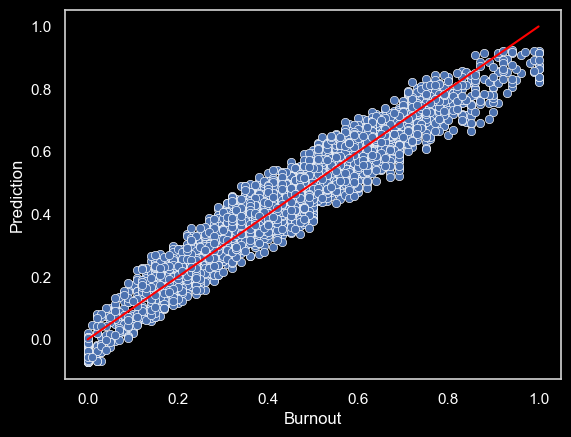

In [54]:
sns.scatterplot(x=y_test, y= pred_test)
plt.plot([0,1],[0,1],'red')
plt.grid()
# Añadir etiquetas y cambiar color de letras y números del eje a blanco
plt.xlabel('Burnout', color='white')
plt.ylabel('Prediction', color='white')

# Cambiar el color de los números del eje a blanco
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')


In [55]:
### Regularizacion
from sklearn.linear_model import Ridge, Lasso, ElasticNet

ridge_reg = Ridge(alpha = 1000) # L2
lasso_reg = Lasso(alpha = 1000) # L1
elastic_reg = ElasticNet(alpha = 10, l1_ratio = 0.5) # l1_ratio*L1 + (1-l1_ratio)*L2

for nombre, model in zip(["Ridge","Lasso","ElasticNet"],[ridge_reg, lasso_reg, elastic_reg]):
    model.fit(X_train,y_train)
    print("Modelo:", nombre)
    print("TRAIN:")
    pred_train  = model.predict(X_train)
    print("MAE:", median_absolute_error(y_train, pred_train))
    print("RMSE:", mean_squared_error(y_train, pred_train, squared= False))
    print("R^2:", lin_reg.score(X_train, y_train))
    print("TEST:")
    pred_test = model.predict(X_test)
    print("MAE:", median_absolute_error(y_test, pred_test))
    print("RMSE:", mean_squared_error(y_test, pred_test, squared= False))
    print("R^2:", lin_reg.score(X_test, y_test))

Modelo: Ridge
TRAIN:
MAE: 0.06759631377720071
RMSE: 0.10121869047679832
R^2: 0.920765848922243
TEST:
MAE: 0.06534596413029745
RMSE: 0.09915022290546971
R^2: 0.9202219777928837
Modelo: Lasso
TRAIN:
MAE: 0.13797942442173206
RMSE: 0.19830494406536128
R^2: 0.920765848922243
TEST:
MAE: 0.1320205755782679
RMSE: 0.1959828448773286
R^2: 0.9202219777928837
Modelo: ElasticNet
TRAIN:
MAE: 0.13797942442173206
RMSE: 0.19830494406536128
R^2: 0.920765848922243
TEST:
MAE: 0.1320205755782679
RMSE: 0.1959828448773286
R^2: 0.9202219777928837


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarnin

In [56]:
import joblib
from joblib import dump, load

from sklearn.model_selection import GridSearchCV


# Guardar el modelo entrenado
model_filename = 'rl_model.pkl'

dump(lin_reg, 'modelo_regresion_lineal.joblib')
joblib.dump(scaler, 'scaler_rl.pkl')


['scaler_rl.pkl']

#### Prueba ficticia de empleado inventado

In [57]:
# Cargar el modelo y el scaler guardados
loaded_model = joblib.load('modelo_regresion_lineal.joblib')
loaded_scaler = joblib.load('scaler_rl.pkl')

In [58]:
empleado1 = pd.DataFrame({
    'gender': [0],
    'company': [1],
    'wfh' : [1],
    'position' : [4],
    'allocation' : [7],
    'mentalfatige' : [3]
})

In [59]:
# Escalar la fila hipotética
empleado1_scaled = loaded_scaler.transform(empleado1)

# Hacer la predicción
predicted_burnout = loaded_model.predict(empleado1_scaled)

print(f"Predicción del nivel de burnout para la fila hipotética: {predicted_burnout[0]}")

Predicción del nivel de burnout para la fila hipotética: 0.30598494753426125


## Prueba con Random Forest

In [60]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Para reproducibilidad
np.random.seed(42)


In [61]:
# Definir el modelo base de Random Forest
rf = RandomForestRegressor(random_state=42)

# Definir el grid de hiperparámetros
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Configurar el Grid Search con validación cruzada
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Entrenar el modelo
grid_search.fit(X_train, y_train)

# Mejor combinación de hiperparámetros
best_params = grid_search.best_params_
print("Mejores hiperparámetros:", best_params)


Fitting 5 folds for each of 324 candidates, totalling 1620 fits


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 1620.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
423 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\bas

Mejores hiperparámetros: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}


In [62]:
# Predecir sobre el conjunto de entreno
y_pred_train = grid_search.predict(X_train)

# Calcular métricas de evaluación
mae = mean_absolute_error(y_train, y_pred_train)
rmse = mean_squared_error(y_train, y_pred_train, squared=False)
r2 = r2_score(y_train, y_pred_train)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")

MAE: 0.03978697278652632
RMSE: 0.049491417829253266
R^2: 0.9377136750329245


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [63]:
# Predecir sobre el conjunto de prueba
y_pred_test = grid_search.predict(X_test)

# Calcular métricas de evaluación
mae = mean_absolute_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")


MAE: 0.04279841370700713
RMSE: 0.05283011556177351
R^2: 0.9273262170688537


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [64]:
import joblib

# Guardar el modelo entrenado
model_filename_rf = 'rf_model.pkl'
joblib.dump(grid_search.best_estimator_, model_filename_rf)
joblib.dump(scaler, 'scaler_rf.pkl')



['scaler_rf.pkl']

In [65]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# Lista de modelos
modelos = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "XGB Regressor" : XGBRegressor(), 
    "LGBM Regressor" : LGBMRegressor(),
    "CatBoost Regressor" : CatBoostRegressor(silent=True),
    "KNN": KNeighborsRegressor(),
    "SVR": SVR(),
}

# Entrenar y evaluar cada modelo
for name, model in modelos.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Métricas de regresión
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f'{name}:')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'R^2 Score: {r2:.4f}')
    print('------------------------------------')


Linear Regression:
Mean Squared Error (MSE): 0.0031
Mean Absolute Error (MAE): 0.0455
R^2 Score: 0.9202
------------------------------------
Ridge Regression:
Mean Squared Error (MSE): 0.0031
Mean Absolute Error (MAE): 0.0455
R^2 Score: 0.9202
------------------------------------
Lasso Regression:
Mean Squared Error (MSE): 0.0384
Mean Absolute Error (MAE): 0.1565
R^2 Score: -0.0001
------------------------------------
Decision Tree:
Mean Squared Error (MSE): 0.0038
Mean Absolute Error (MAE): 0.0481
R^2 Score: 0.9010
------------------------------------
Random Forest:
Mean Squared Error (MSE): 0.0034
Mean Absolute Error (MAE): 0.0458
R^2 Score: 0.9123
------------------------------------
Gradient Boosting:
Mean Squared Error (MSE): 0.0028
Mean Absolute Error (MAE): 0.0435
R^2 Score: 0.9268
------------------------------------
XGB Regressor:
Mean Squared Error (MSE): 0.0029
Mean Absolute Error (MAE): 0.0432
R^2 Score: 0.9257
------------------------------------
[LightGBM] [Info] Auto-cho

### Optimización del modelo 

Basándome en el criterio de tomar el modelo con el MAE más bajo y el R2 más alto, optimizo el modelo LGBM.

In [66]:
from sklearn.model_selection import GridSearchCV


In [67]:
param_grid = {
    'learning_rate': [0.05, 0.1, 0.2], # Tasa de aprendizaje que controla la contribución de cada árbol
    'n_estimators': [50, 100, 200], # Número de árboles en el modelo
    'max_depth': [3, 5, 7], # Profundidad máxima de cada árbol.
    'num_leaves': [5, 10, 20], # Número máximo de hojas en un árbol
    'min_child_samples': [10, 20, 30], # Número mínimo de muestras necesarias en cada hoja.
    'reg_alpha': [0.0, 0.1, 0.5], # Regularización L1 para controlar la complejidad del modelo.
    'reg_lambda': [0.0, 0.1, 0.5] # Regularización L2 para controlar la complejidad del modelo.
}

grid_search = GridSearchCV(estimator=LGBMRegressor(), param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, verbose=1)
grid_search.fit(X_train, y_train)

print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)


Fitting 5 folds for each of 2187 candidates, totalling 10935 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 11897, number of used features: 6
[LightGBM] [Info] Start training from score 0.452762
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 11897, number of used features: 6
[LightGBM] [Info] Start training from score 0.452500
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col

In [68]:
# Predecir sobre el conjunto de entreno
y_pred_train = grid_search.predict(X_train)

# Calcular métricas de evaluación
mae = mean_absolute_error(y_train, y_pred_train)
rmse = mean_squared_error(y_train, y_pred_train, squared=False)
r2 = r2_score(y_train, y_pred_train)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")

MAE: 0.041911465402912955
RMSE: 0.05168432560264188
R^2: 0.9320717191320982


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [69]:
# Predecir sobre el conjunto de prueba
y_pred_test = grid_search.predict(X_test)

# Calcular métricas de evaluación
mae = mean_absolute_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)


print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")



MAE: 0.04296670988171881
RMSE: 0.052609818324075255
R^2: 0.9279310407993355


c:\Users\maria\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [70]:
comparacion = pd.DataFrame({'real' : y_test, 'predicho' : y_pred_test})

comparacion['error'] = comparacion['real'] - comparacion['predicho']

comparacion['porcentaje'] = (comparacion['error'].abs()/comparacion['real'])*100

# print(comparacion)

comparacion['porcentaje'].sort_values(ascending=False)

comparacion.loc[22036]


real          0.000000
predicho      0.020833
error        -0.020833
porcentaje         inf
Name: 22036, dtype: float64

In [71]:
# Calcular el porcentaje de error, manejando el caso cuando 'real' es 0
def calcular_porcentaje_error(row):
    if row['real'] == 0:
        return 0
    else:
        return (abs(row['error'])) * 100

comparacion['porcentaje'] = comparacion.apply(calcular_porcentaje_error, axis=1)

# Ordenar por el porcentaje de error
comparacion_ordenada = comparacion['porcentaje'].sort_values(ascending=False)

# Imprimir la fila específica
print(comparacion.loc[14434])

# Imprimir las primeras filas del DataFrame ordenado
print(comparacion_ordenada.head())


real          0.030000
predicho      0.096211
error        -0.066211
porcentaje    6.621077
Name: 14434, dtype: float64
10904    20.735604
5679     18.530270
9165     17.916890
18867    17.357961
7147     17.177477
Name: porcentaje, dtype: float64


In [72]:
comparacion.head(5)

,real,predicho,error,porcentaje
8815,0.18,0.260118,-0.080118,8.011791
10896,0.29,0.390228,-0.100228,10.022782
16049,0.36,0.361590,-0.001590,0.159007
1746,0.48,0.513232,-0.033232,3.323232
5473,0.79,0.749523,0.040477,4.047654


C:\Users\maria\AppData\Local\Temp\ipykernel_5000\3425401352.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(comparacion['real'], comparacion['predicho'], cmap='viridis')
C:\Users\maria\AppData\Local\Temp\ipykernel_5000\3425401352.py:5: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cbar = plt.colorbar(plt.scatter(comparacion['real'], comparacion['predicho'], cmap='viridis'))


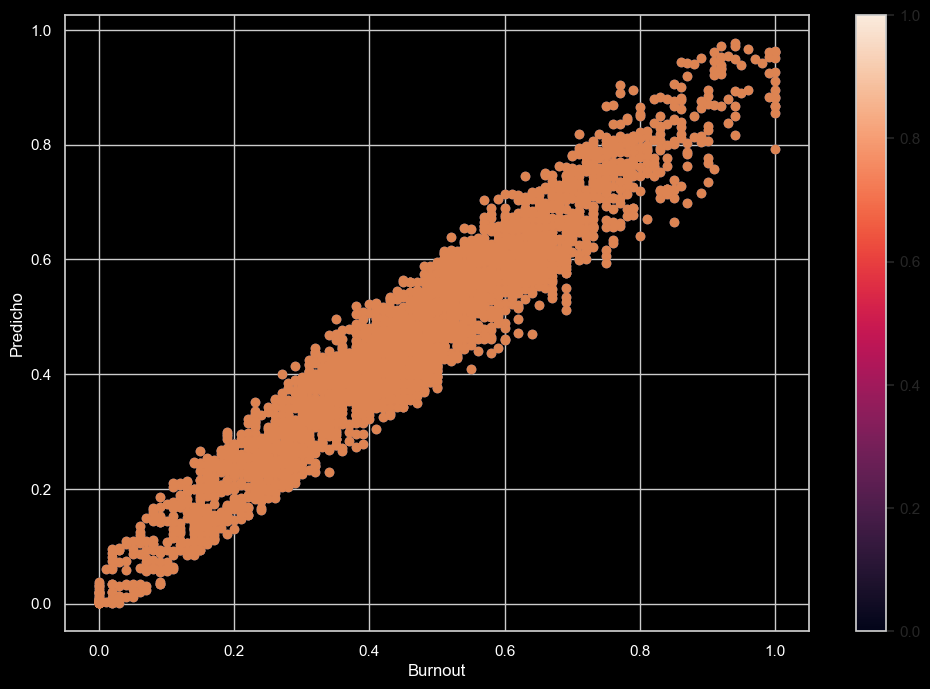

In [73]:
plt.figure(figsize=(12, 8))
plt.scatter(comparacion['real'], comparacion['predicho'], cmap='viridis')
plt.xlabel('Burnout', color = 'white')
plt.ylabel('Predicho', color='white')
cbar = plt.colorbar(plt.scatter(comparacion['real'], comparacion['predicho'], cmap='viridis'))
# Cambiar el color de los números del eje a blanco
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')

In [74]:
# Guardar el modelo optimizado
best_model = grid_search.best_estimator_
joblib.dump(best_model, 'lgbm_model.pkl')
joblib.dump(scaler, 'scaler_lgbm.pkl')


print("Modelo guardado exitosamente")


Modelo guardado exitosamente


#### Prueba ficticia de empleado inventado

In [75]:
# Cargar el modelo y el scaler guardados
loaded_model = joblib.load('lgbm_model.pkl')
loaded_scaler = joblib.load('scaler_lgbm.pkl')

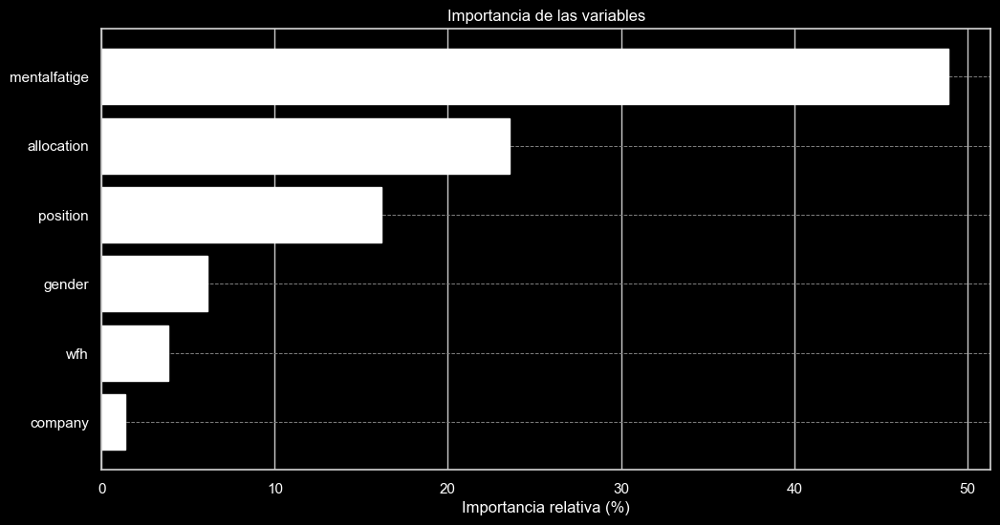

In [77]:
importances = loaded_model.feature_importances_
feature_names = ['gender', 'company', 'wfh', 'position', 'allocation', 'mentalfatige']

# Normalize the importances to sum to 100
importances_normalized = 100 * importances / np.sum(importances)

# Ordenar las características por su importancia
indices = np.argsort(importances_normalized)

# Ajustar el tema de Matplotlib para el fondo negro y letras blancas
plt.figure(figsize=(12, 6))
plt.gca().set_facecolor('black')
plt.grid(axis='y', color='gray', linestyle='--', linewidth=0.7)

# Crear el gráfico de barras
bars = plt.barh(range(len(indices)), importances_normalized[indices], align='center', color='white')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], color='white')
plt.xlabel('Importancia relativa (%)', color='white')
plt.title('Importancia de las variables', color='white')

# Ajustar los ticks
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')

# Mostrar el gráfico
plt.show()


In [78]:
empleados = pd.DataFrame({
    'gender': [0, 1], 
    'company': [1, 0],
    'wfh' : [1, 0],
    'position' : [4, 1],
    'allocation' : [7, 2],
    'mentalfatige' : [3, 8]
})

In [79]:
# Escalar la fila hipotética
empleados_scaled = loaded_scaler.transform(empleados)

# Hacer la predicción
predicted_burnout = loaded_model.predict(empleados_scaled)

print(f"Predicción del nivel de burnout para la fila hipotética: {predicted_burnout[1]}")

Predicción del nivel de burnout para la fila hipotética: 0.6045345080747362
